In [ ]:
# set main directory name
dir = dirname(pwd());

In [1]:
using DifferentialEquations
using JumpProcesses
using Plots
# using PlotlyJS
using Statistics
using Distributions
using Random
using JLD2

using Optimization
using OptimizationOptimJL
# using BlackBoxOptim

using CSV
using DataFrames
using DelimitedFiles

# include own module with functionalities, ATTENTION, this will include StatsPlots
include("functionalities.jl")


# set seed for reproducibility
Random.seed!(123);

# Exponential Proportional model
Exponential growth with the proportional metastasis rate model.

In [2]:
# set parameter values

beta = 0.5
m_basal = 0.01
m_size = 0.003

m_sigma = 0.03
m_order = 1.0

d_size = 0.001
d_metastasis = 0.002
θ = [beta, m_basal, m_size, m_sigma, m_order, d_size, d_metastasis]
p = (beta = beta, m_basal = m_basal, m_size = m_size, m_sigma = m_sigma, m_order = m_order, d_size = d_size, d_metastasis = d_metastasis)

# initial condition
S0 = 0.065

0.065

## Simulation

In [3]:
include("general_MNR_simulation_algorithm.jl")

simulate_many_MNR (generic function with 1 method)

In [4]:
# get exponential tumour growth
function expgrowth!(du, u, p, t)
    du[1] = p[1]* u[1]
end

function TumorPath(S0, p; endtime=30.0)
    prob = ODEProblem(expgrowth!, [S0], (0.0, endtime), [p.beta])
    sol = solve(prob, Tsit5(), reltol=1e-8, abstol=1e-8)
    return sol
end

TumorPath (generic function with 1 method)

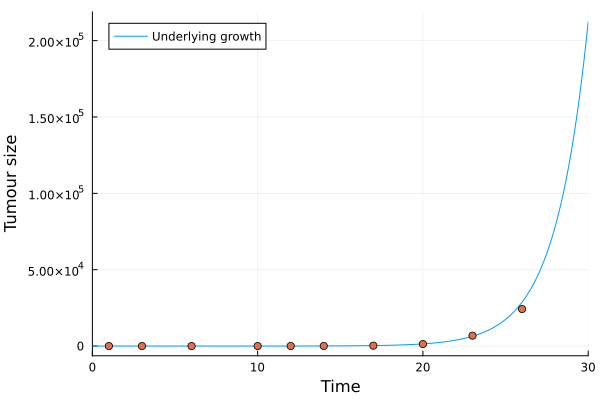

In [149]:
example_tumour = TumorPath(S0, p, endtime=30.0)

# add noise to the tumour growth
example_tumour_observations = []
for t in timepoints
    t_idc = findall(example_tumour.t .<= t)[end]
    push!(example_tumour_observations, example_tumour.u[t_idc] + 0.1*randn()*example_tumour.u[t_idc])
end
example_tumour_observations = [max(0, example_tumour_observations[i][1]) for i in 1:length(example_tumour_observations)]

plt = plot(example_tumour, label="Underlying growth", xlabel="Time", ylabel="Tumour size")

scatter!(plt, [1,3,6,10,12,14,17,20,23, 26],
    [example_tumour_observations[i+1] for i in [1,3,6,10,12,14,17,20,23, 26]], label="", xlabel="Time", ylabel="Tumour size")

In [ ]:
# savefig(plt, joinpath(dir, "figures/ode_paper/example_tumour_growth_observations.pdf"))

In [ ]:
# simulate dataset
npat = 500
proportional_data = simulate_many_MNR(p, TumorPath, npat=npat, S0=S0, metastatic_model="proportional_intensity")

# data_path = joinpath(dir,"data/proportional_data_$(npat)_patients_$(θ)_promise2.jld2")
# save(data_path, "proportional_data", proportional_data)

In [4]:
# load data
npat = 500
data_path = joinpath(dir,"data/proportional_data_$(npat)_patients_$(θ).jld2")
proportional_data = load(data_path)["proportional_data"];

In [5]:
data_summary(proportional_data)

Dict{String, Real} with 10 entries:
  "Mean survival time:"          => 24.2302
  "Low Quantile survival time:"  => 21.3947
  "Mean metastasis at day 10:"   => 0.161943
  "Mean metastasis at death:"    => 2.3871
  "Mean tumor size at day 10:"   => 9.70422
  "High Quantile survival time:" => 27.6585
  "Maximal metastasis number:"   => 12
  "Mean metastasis at day 20:"   => 0.648019
  "Patients died:"               => 434
  "Maximum metastasis increase:" => 5

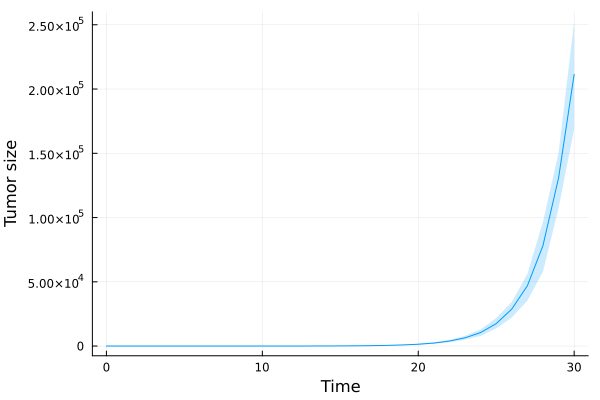

In [53]:
timepoints = 0.0:1.0:30.0
npat = length(unique(proportional_data.patient_id))
tumor_mean = []
tumor_low_ci = []
tumor_high_ci = []
metastasis_mean = []
metastasis_low_ci = []
metastasis_high_ci = []
dead = []
    for t in unique(timepoints)
        push!(tumor_mean, mean(proportional_data[proportional_data.time .== t, :tumor]))
        push!(tumor_low_ci, quantile(proportional_data[proportional_data.time .== t, :tumor], 0.01))
        push!(tumor_high_ci, quantile(proportional_data[proportional_data.time .== t, :tumor], 0.99))

    end
plot(timepoints, tumor_mean, ribbon=((tumor_mean-tumor_low_ci),tumor_high_ci-tumor_mean), fillalpha=0.2, label="",
    xlabel="Time", ylabel="Tumor size", legend=:topleft)
# savefig(joinpath(pwd(),"figures/ode_paper/proportional_tumor_size_example_patient.pdf"))

In [31]:
metastasis_scatter = [[proportional_data.metastasis[proportional_data.patient_id .== 5,:]...][i] for i in [1,3,6,10,12,14,17,20,23]]
scatter([1,3,6,10,12,14,17,20,23], metastasis_scatter, label=false,
    xlabel="Time", ylabel="Number of metastasis",
    yticks=(0:2, 0:2), tickfontsize=12, guidefontsize=12)
# savefig(joinpath(pwd(),"figures/ode_paper/metastasis_scatter_example_patient.pdf"))

"/Users/vincentwieland/PhD/Projects/method_project/second_model/figures/ode_paper/metastasis_scatter_example_patient.pdf"

In [74]:
sparse_data = DataFrame(patient_id = Int[], time = Float64[], tumor = Float64[], metastasis = Int[], death = Int[])
for id in unique(proportional_data.patient_id)
    patient_data = proportional_data[proportional_data.patient_id .== id, :]
    len = size(patient_data, 1)
    new_patient_data = patient_data[sample(axes(patient_data, 1), ceil(Int, len/1.4); replace = false, ordered = true), :]
    # check if deathpoint is in there
    if sum(new_patient_data.death) == 0
        # if not, add it
        death_data = patient_data[patient_data.death .== 1, :]
        append!(new_patient_data, death_data)
    end
    append!(sparse_data, new_patient_data)
end


In [6]:
data_summary(sparse_data)

Dict{String, Real} with 10 entries:
  "Mean survival time:"          => 24.2302
  "Low Quantile survival time:"  => 21.3947
  "Mean metastasis at day 10:"   => 0.146409
  "Mean metastasis at death:"    => 2.3871
  "Mean tumor size at day 10:"   => 9.71923
  "High Quantile survival time:" => 27.6585
  "Maximal metastasis number:"   => 11
  "Mean metastasis at day 20:"   => 0.624595
  "Patients died:"               => 434
  "Maximum metastasis increase:" => 5

In [5]:
# # save sparse data
# data_path = joinpath(pwd(),"data/simplified_model/sparse_proportional_data_$(npat)_patients_$(θ)_promise2.jld2")
# save(data_path, "sparse_proportional_data", sparse_data)

# # load sparse data
npat = 500
data_path = joinpath(pwd(),"data/simplified_model/sparse_proportional_data_$(npat)_patients_$(θ)_promise2.jld2")
sparse_data = load(data_path)["sparse_proportional_data"];

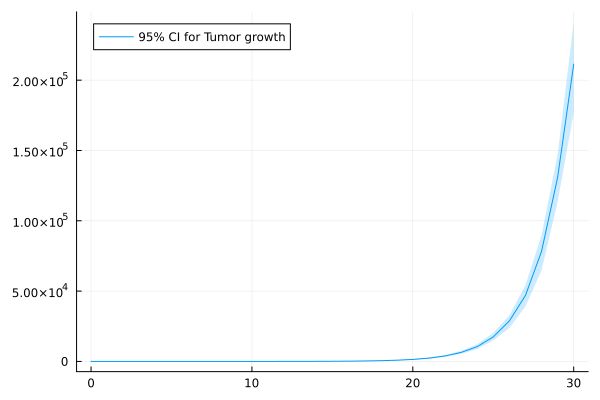

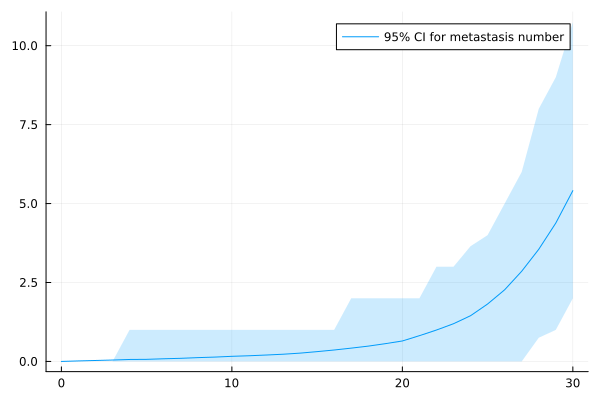

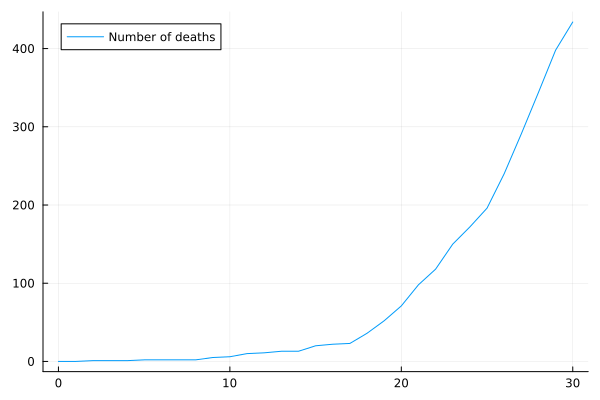

In [8]:
visualize_data_trajectories(proportional_data)

In [12]:
npat = 500
proportional_data_list = []
p_list = [(beta = 0.48, m_basal = 0.01, m_size = 0.003, m_sigma = 0.03, m_order = 1.0, d_size = 0.001, d_metastasis = 0.002),
          (beta = 0.49, m_basal = 0.01, m_size = 0.003, m_sigma = 0.03, m_order = 1.0, d_size = 0.001, d_metastasis = 0.002),
          (beta = 0.5, m_basal = 0.01, m_size = 0.003, m_sigma = 0.03, m_order = 1.0, d_size = 0.001, d_metastasis = 0.002),
          (beta = 0.51, m_basal = 0.01, m_size = 0.003, m_sigma = 0.03, m_order = 1.0, d_size = 0.001, d_metastasis = 0.002),
          (beta = 0.52, m_basal = 0.01, m_size = 0.003, m_sigma = 0.03, m_order = 1.0, d_size = 0.001, d_metastasis = 0.002)]
for p in p_list
    push!(proportional_data_list, simulate_many_MNR(p, TumorPath, npat=npat, S0=S0, metastatic_model="proportional_intensity"))
end


Simulation failed for patient 154
ArgumentError("The interval [a,b] is not a bracketing interval.\nYou need f(a) and f(b) to have different signs (f(a) * f(b) < 0).\nConsider a different bracket or try fzero(f, c) with an initial guess c.\n\n")

In [ ]:
prop_mid_data = simulate_many_MNR(p, TumorPath, npat=npat, S0=S0, metastatic_model="proportional_intensity", rng=MersenneTwister(1234))

In [ ]:
proportional_data_list[3] = prop_mid_data

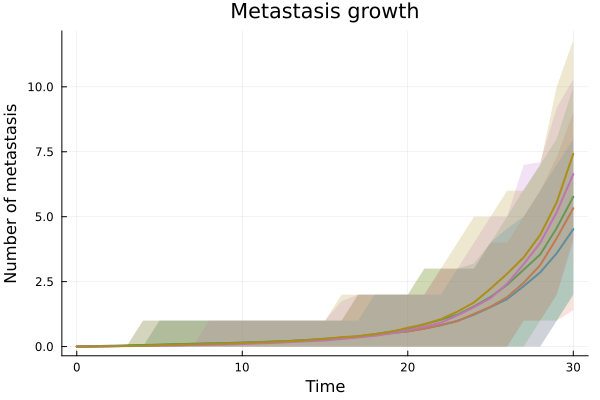

In [24]:
timepoints = 0.0:1.0:30.0
plt = plot()

for proportional_data in proportional_data_list
    tumor_mean = []
    tumor_low_ci = []
    tumor_high_ci = []
    metastasis_mean = []
    metastasis_low_ci = []
    metastasis_high_ci = []
    dead = []
        for t in unique(timepoints)
            push!(tumor_mean, mean(proportional_data[proportional_data.time .== t, :tumor]))
            push!(tumor_low_ci, quantile(proportional_data[proportional_data.time .== t, :tumor], 0.05))
            push!(tumor_high_ci, quantile(proportional_data[proportional_data.time .== t, :tumor], 0.95))
            push!(metastasis_mean, mean(proportional_data[proportional_data.time .== t, :metastasis]))
            push!(metastasis_low_ci, quantile(proportional_data[proportional_data.time .== t, :metastasis], 0.05))
            push!(metastasis_high_ci, quantile(proportional_data[proportional_data.time .== t, :metastasis], 0.95))
            push!(dead, npat - size(proportional_data[proportional_data.time .== t, :])[1])
        end
    # display(plot(timepoints, tumor_mean, ribbon=((tumor_mean-tumor_low_ci),tumor_high_ci-tumor_mean), fillalpha=0.2, label="95% CI for Tumor growth"))
    # display(plot(timepoints, dead, label="Number of deaths"))


    plot!(plt, timepoints, 
        metastasis_mean, 
        ribbon=((metastasis_mean-metastasis_low_ci),metastasis_high_ci-metastasis_mean), 
        fillalpha=0.2,
        linewidth = 2,)
end
plot!(plt, title="Metastasis growth", xlabel="Time", ylabel="Number of metastasis", legend=false)

In [25]:
savefig(plt, joinpath(pwd(), "figures/ode_paper/metastasis_growth_different_proportional_intensity.pdf"))

"/Users/vincentwieland/PhD/Projects/method_project/second_model/figures/ode_paper/metastasis_growth_different_proportional_intensity.pdf"

## Analytical vs. Numerical Likelihoods
Here, we want to evalaute the efficiancy gain by the use of analytical likelihoods.

In [7]:
include("ProportionalLikelihoods.jl");
import .ProportionalLikelihoods as PL

In [ ]:
x = [0.503, 0.011, 0.016, 0.00013, 0.0095]

test_res = @benchmark PL.NumericNegLogLikelihood(x, proportional_data, S0 = 0.065)

In [90]:
# load benchmark results from csv to dataframe
benchmark_df = CSV.read("output/results/benchmark_proportional_likelihoods_$(npat)_patients_$(θ).csv", DataFrame);
# convert strings in the time columns to floats
benchmark_df.Analytic_Time = [parse(Float64,split(split(benchmark_df.Analytic_Time[i], " ")[1], "(")[2])
                                for i in eachindex(benchmark_df.Analytic_Time)]
benchmark_df.Numeric_Time = [parse(Float64,split(split(benchmark_df.Numeric_Time[i], " ")[1], "(")[2])
                                for i in eachindex(benchmark_df.Numeric_Time)] 
benchmark_df.FG_Time = [parse(Float64,split(split(benchmark_df.FG_Time[i], " ")[1], "(")[2])
                                for i in eachindex(benchmark_df.FG_Time)];

In [119]:
mean(benchmark_df.Numeric_Time)

893.8820799999999

In [133]:
# plot numeric vs analytical llh values
plot(benchmark_df.Analytic_Value, benchmark_df.Numeric_Value,  xlabel="Analytic Neg. Llh", ylabel="Numeric Neg. Llh", seriestype=:scatter, legend=false)
plot!(minimum(benchmark_df.Analytic_Value):maximum(benchmark_df.Analytic_Value),
    minimum(benchmark_df.Analytic_Value):maximum(benchmark_df.Analytic_Value),
    color=:black, linestyle=:dash, label="y=x")
plot!(tickfontsize=12, legenfontsize=12, guidefontsize=12, titlefontsize=12)

# savefig("figures/ode_paper/benchmark_numeric_vs_analytic_llh_proportional_$(npat)_patients_$(θ).pdf")

"/home/vincent/PhD/Projects/method_project/second_model/figures/ode_paper/benchmark_numeric_vs_analytic_llh_proportional_500_patients_[0.5, 0.01, 0.003, 0.03, 1.0, 0.001, 0.002].pdf"

In [131]:
bplt1 = scatter(ones(100),benchmark_df.Analytic_Time, xlimit=(0.0, 3.0), label="Analytic Times", color=:blue, xticks=false)
@df benchmark_df boxplot!(bplt1, ones(100),:Analytic_Time, label=false, color=:blue, fillalpha=0.5, ylabel="Time [ms]")

scatter!(bplt1, ones(100)*2,benchmark_df.Numeric_Time, xlimit=(0.0, 3.0), label="Numeric Times", color=:orange, xticks=false)
@df benchmark_df boxplot!(bplt1, ones(100)*2,:Numeric_Time, label=false, color=:orange, fillalpha=0.5, ylabel="Time [ms]")
plot!(bplt1, xticks =([1, 2], ["Analytic", "Numeric"]), xlabel="Method")

plot!(bplt1, legendfontsize=12, tickfontsize=12)

# savefig("figures/ode_paper/benchmark_times_boxplot_proportional_$(npat)_patients_$(θ)_times.pdf")

"/home/vincent/PhD/Projects/method_project/second_model/figures/ode_paper/benchmark_times_boxplot_proportional_500_patients_[0.5, 0.01, 0.003, 0.03, 1.0, 0.001, 0.002]_times.pdf"

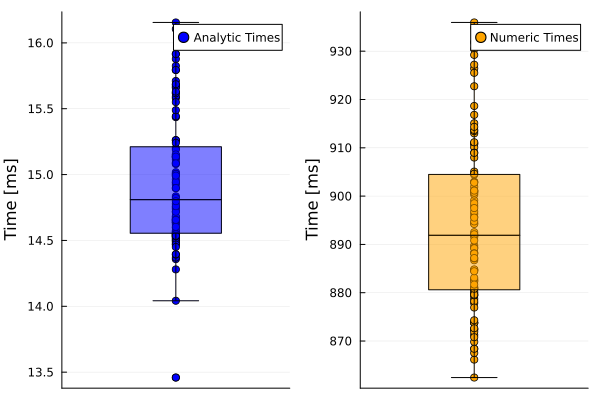

In [49]:
bplt1 = scatter(ones(100),benchmark_df.Analytic_Time, xlimit=(0.0, 2.0), label="Analytic Times", color=:blue, xticks=false)
@df benchmark_df boxplot!(bplt1, ones(100),:Analytic_Time, label=false, color=:blue, fillalpha=0.5, ylabel="Time [ms]")

bplt2 = scatter(ones(100),benchmark_df.Numeric_Time, xlimit=(0.0, 2.0), label="Numeric Times", color=:orange, xticks=false)
@df benchmark_df boxplot!(bplt2, ones(100),:Numeric_Time, label=false, color=:orange, fillalpha=0.5, ylabel="Time [ms]")

StatsPlots.plot(bplt1, bplt2)

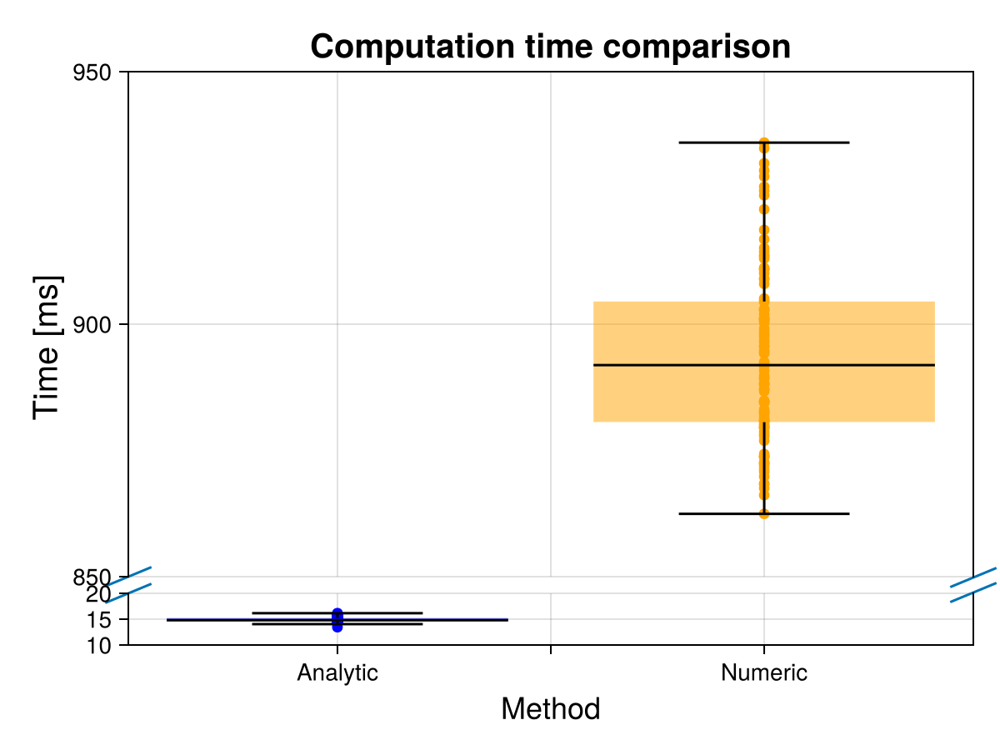

In [33]:
# for the below to work one should not import Plots and StatsPlots somewhere (so comment it ou in the above preambel!)

using Makie
using CairoMakie

f = Figure()

lims = Observable(((10.0, 20.0), (850.0, 950.0)))

g = f[1, 1] = GridLayout()

ax_top = Axis(f[1, 1][1, 1], title = "Computation time comparison", titlesize=20,
ylabel="Time [ms]     ", 
ylabelsize=20)
ax_bottom = Axis(f[1, 1][2, 1], xlabel="Method", xlabelsize=18, 
xtickformat= values -> ["Analytic", " ", "Numeric"])

on(lims) do (bottom, top)
    ylims!(ax_bottom, bottom)
    ylims!(ax_top, top)
    rowsize!(g, 1, Auto(top[2] - top[1]))
    rowsize!(g, 2, Auto(bottom[2] - bottom[1]))
end

hidexdecorations!(ax_top, grid = false)
ax_top.bottomspinevisible = false
ax_bottom.topspinevisible = false

linkxaxes!(ax_top, ax_bottom)
rowgap!(g, 10)

angle = pi/8
linelength = 30

segments = lift(
        @lift($(ax_top.yaxis.attributes.endpoints)[1]),
        @lift($(ax_bottom.yaxis.attributes.endpoints)[2]),
        @lift($(ax_top.elements[:yoppositeline][1])[1]),
        @lift($(ax_bottom.elements[:yoppositeline][1])[2]),
    ) do p1, p2, p3, p4
    ps = Point2f[p1, p2, p3, p4]
    
    map(ps) do p
        a = p + Point2f(cos(angle), sin(angle)) * 0.5 * linelength
        b = p - Point2f(cos(angle), sin(angle)) * 0.5 * linelength
        (a, b)
    end
end

linesegments!(f.scene, segments)

Makie.scatter!(ax_top, ones(100)*2 , benchmark_df.Numeric_Time, color=:orange)
Makie.boxplot!(ax_top, ones(100)*2 , benchmark_df.Numeric_Time, color=(:orange, 0.5), whiskerwidth=0.5)
Makie.scatter!(ax_bottom, ones(100)*1, benchmark_df.Analytic_Time, color=:blue)
Makie.boxplot!(ax_bottom, ones(100)*1 , benchmark_df.Analytic_Time, color=(:blue, 0.5), whiskerwidth=0.5)

notify(lims)

f

# save("figures/ode_paper/benchmark_times_proportional_likelihoodds_$(npat)_patients_$(θ).pdf", f)

We see a significant speed-up. More than the 20x-fold!

## Inference


In [8]:

using BenchmarkTools
using LatinHypercubeSampling

log_lb_x0 = [-0.75, -7, -7, -9, -9]
log_ub_x0 = [-0.65, -2, -2, -4, -4]

n_starts = 100 

plan,_ = LHCoptim(n_starts, length(log_lb_x0), 1000)
scaled_plan = scaleLHC(plan, [(log_lb_x0[i], log_ub_x0[i]) for i in eachindex(log_lb_x0)]);

x0_vectors = [scaled_plan[i, :] for i in 1:size(scaled_plan, 1)];

# save startpoints
# save("data/startpoints_proportional_likelihoods_$(n_starts)_starts_$(npat)_patients_$(θ).jld2", "startpoints", x0_vectors)

x0_vectors = load("data/startpoints_proportional_likelihoods_$(n_starts)_starts_$(npat)_patients_$(θ).jld2")["startpoints"];

x0 = x0_vectors[1];

In [91]:
betaOptim(x, p) = PL.TumorNegLogLikelihood(x[1], proportional_data, S0=0.065)
betaOptimFunc = OptimizationFunction(betaOptim, Optimization.AutoForwardDiff())
betaOptimProblem = OptimizationProblem(betaOptimFunc, [exp.(x0)[1]], lb=zeros(1).+1e-4, ub=ones(1))
betaEst = solve(betaOptimProblem, LBFGS(), maxiters=10^4, maxtime=30.0)
println("Beta:", betaEst, "\n")

Beta:retcode: Success
u: [0.4999942483432296]
Final objective value:     29610.94279615074




In [19]:
metOptim(x, p) = PL.MetastasisNegLogLikelihood([betaEst[1], x[1], x[2]], proportional_data, S0=0.065)
metOptimFunc = OptimizationFunction(metOptim, Optimization.AutoForwardDiff())
metOptimProblem = OptimizationProblem(metOptimFunc, x0[2:3], lb=zeros(2).+1e-4, ub=ones(2))
metEst = solve(metOptimProblem, LBFGS(), maxiters=10^5)
println("Metastasis:", metEst, "\n")

Metastasis:retcode: Success
u: [0.012330663667016094, 0.0030153582682810303]
Final objective value:     3446.2430820475465




In [20]:
deathOptim(x, p) = PL.DeathNegLogLikelihood([betaEst[1], metEst[1], metEst[2], x[1], x[2]], proportional_data, S0=0.065)
deathOptimFunc = OptimizationFunction(deathOptim, Optimization.AutoForwardDiff())
deathOptimProblem = OptimizationProblem(deathOptimFunc, x0[4:5], lb=zeros(2).+1e-4, ub=ones(2))
deathEst = solve(deathOptimProblem, LBFGS(), maxiters=10^5, maxtime=600.0)
println("Death Estimation:", deathEst, "\n")

Death Estimation:retcode: Success
u: [0.0009827295178882636, 0.004551221877145948]
Final objective value:     1370.2638520503654




In [63]:
# jointly all parameters

OptimLlh(x, p) = PL.NegLogLikelihood(x, proportional_data, S0=0.065)
OptimFunc = OptimizationFunction(OptimLlh, Optimization.AutoForwardDiff())
OptimProblem = OptimizationProblem(OptimFunc, x0, lb=zeros(5).+1e-4, ub=ones(5))
SAMIN_est = solve(OptimProblem, SAMIN(), maxiters=10^6, maxtime=300.0, store_trace=true)
println("Joint Estimation:", SAMIN_est, "\n")

SAMIN results
NO CONVERGENCE: MAXEVALS exceeded

     Obj. value:       43584.46328

       parameter      search width
         0.49993           0.13872 
         0.01355           0.99990 
         0.00310           0.99990 
         0.00086           0.99990 
         0.00928           0.99990 
Joint Estimation:retcode: Failure
u: [0.499925599111241, 0.01355024108117316, 0.003101050692192691, 0.0008637786655700634, 0.009277109954777185]
Final objective value:     43584.46327687393




In [104]:
# jointly all parameters with callback

obj_values = []
times = []
function callback(p, l)
    push!(obj_values, l)
    push!(times, time_ns())
    return false
end

OptimLlh(x, p) = PL.NegLogLikelihood(x, proportional_data, S0=0.065)
OptimFunc = OptimizationFunction(OptimLlh, Optimization.AutoForwardDiff())
OptimProblem = OptimizationProblem(OptimFunc, x0, lb=zeros(5).+1e-4, ub=ones(5))
joint_est = solve(OptimProblem, LBFGS(), maxiters=10^6, maxtime=1500.0, store_trace=true, callback=callback)
println("Joint Estimation:", joint_est, "\n")

Joint Estimation:retcode: Success
u: [0.49996390051157347, 0.012329015273428175, 0.003015392398294117, 0.0009827242541826009, 0.0045512250537821245]
Final objective value:     43581.1833406107




In [204]:
# load optimization result
nstarts = 100
optimizer = "SAMIN"
Llh_type ="Analytic"
SAMIN_result_path = joinpath(pwd(),"output/results/proportional_joined_optimization_$(nstarts)_starts_$(optimizer)_distributed_$(Llh_type).jld2")
SAMIN_results = load(SAMIN_result_path)["results"]
SAMIN_par_names = SAMIN_results["par_names"]
SAMIN_results = SAMIN_results["optimization_results"]
SAMIN_nllhs_list = [SAMIN_results[i]["nllh"] for i in 1:nstarts]
SAMIN_par_list = [SAMIN_results[i]["parameter"] for i in 1:nstarts];

SAMIN_example = SAMIN_results[1]
SAMIN_mean_time = mean([SAMIN_results[i]["time_trace"][end] for i in 1:nstarts])
SAMIN_max_time = maximum([SAMIN_results[i]["time_trace"][end] for i in 1:nstarts]);

In [205]:
# load optimization result
nstarts = 100
optimizer = "SAMIN"
Llh_type ="Numeric"
Numeric_result_path = joinpath(pwd(),"output/results/proportional_joined_optimization_$(nstarts)_starts_$(optimizer)_distributed_$(Llh_type).jld2")
Numeric_results = load(Numeric_result_path)["results"]
Numeric_par_names = Numeric_results["par_names"]
Numeric_results = Numeric_results["optimization_results"]
Numeric_nllhs_list = [Numeric_results[i]["nllh"] for i in 1:nstarts]
Numeric_par_list = [Numeric_results[i]["parameter"] for i in 1:nstarts];

Numeric_example = Numeric_results[1]
Numeric_mean_time = mean([Numeric_results[i]["time_trace"][end] for i in 1:nstarts])
Numeric_max_time = maximum([Numeric_results[i]["time_trace"][end] for i in 1:nstarts]);

In [31]:
# load optimization result
nstarts = 100
optimizer = "LBFGS"
Llh_type = "Analytic"
proportional_result_path = joinpath(pwd(),"output/results/proportional_joined_optimization_$(nstarts)_starts_$(optimizer)_distributed_$(Llh_type).jld2")
proportional_results = load(proportional_result_path)["results"]
proportional_par_names = proportional_results["par_names"]
proportional_results = proportional_results["optimization_results"]
proportional_nllhs_list = [proportional_results[i]["nllh"] for i in 1:nstarts]
proportional_par_list = [proportional_results[i]["parameter"] for i in 1:nstarts];
LBFGS_example = proportional_results[1]
LBFGS_mean_time = mean([proportional_results[i]["time_trace"][end] for i in 1:nstarts])
LBFGS_max_time = maximum([proportional_results[i]["time_trace"][end] for i in 1:nstarts]);

┌ Warning: type Optimization.OptimizationForwarddiffExt.#37#55{OptimizationFunction{true, AutoForwardDiff{nothing, Nothing}, Main.ProportionalLikelihoods.var"#Optim#72"{Float64, DataFrame}, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED_NO_TIME), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing},Optimization.ReInitCache{Vector{Float64}, SciMLBase.NullParameters}} does not exist in workspace; reconstructing
└ @ JLD2 /home/vincent/.julia/packages/JLD2/bfPAo/src/data/reconstructing_datatypes.jl:633
┌ Warning: some parameters could not be resolved for type ForwardDiff.Dual{ForwardDiff.Tag{JLD2.ReconstructedMutable{Symbol("#37#55{OptimizationFunction{true, AutoForwardDiff{nothing, Nothing}, Main.ProportionalLikelihoods.var\"#Optim#72\"{Float64, DataFrame}, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, type

In [32]:
LBFGS_mean_time, SAMIN_mean_time, Numeric_mean_time

(13.251057211320001, 501.05887162556996, 26565.601482919832)

In [35]:
minimum(proportional_nllhs_list), minimum(SAMIN_nllhs_list), minimum(Numeric_nllhs_list)

(43581.1833406099, 43581.18334060922, 43581.18334060979)

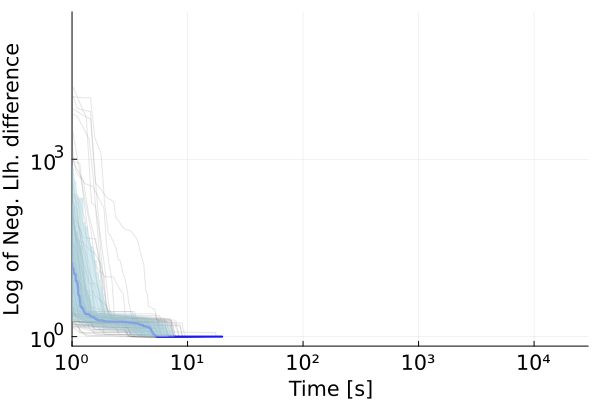

"/Users/vincentwieland/PhD/Projects/method_project/second_model/figures/ode_paper/trace_plot_proportional_100_starts_LBFGS_Analytic.pdf"

In [213]:
optimizer ="LBFGS"
nstarts = 100
Llh_type = "Analytic"
xlimits = (0.0, log10(max(Numeric_max_time, SAMIN_max_time, LBFGS_max_time)))

optimizer_trace_plots(proportional_results, xlim=xlimits)
savefig(joinpath(pwd(), "figures/ode_paper/trace_plot_proportional_$(nstarts)_starts_$(optimizer)_$(Llh_type).pdf"))

In [62]:
all_obj_tr = []
all_t_tr = []
for id in eachindex(Numeric_results)
    t_tr, obj_tr = Numeric_results[id]["time_trace"], Numeric_results[id]["obj_val_trace"]
    min_obj = minimum(obj_tr)
    obj_tr_sorted = []
    sort_idx= []
    for i in eachindex(obj_tr)
        if i == 1
            push!(obj_tr_sorted, obj_tr[i]-min_obj+1)
            push!(sort_idx, i)
        elseif obj_tr[i]-min_obj+1 <= obj_tr_sorted[end]
            push!(obj_tr_sorted, obj_tr[i]-min_obj+1)
            push!(sort_idx, i)
        end
    end
    t_tr_sorted = t_tr[sort_idx]
    push!(all_obj_tr, obj_tr_sorted)
    push!(all_t_tr, t_tr_sorted)
end

all_timepoints = sort(unique(vcat(all_t_tr...)))

percentile_values = []
# median_values = []
for t in all_timepoints
    values = [all_obj_tr[i][findlast(all_t_tr[i].<=t)] for i in 1:nstarts]
    # push!(median_values, median(values))
    push!(percentile_values, quantile(values, [0.1, 0.25, 0.5, 0.75, 0.9]))
end

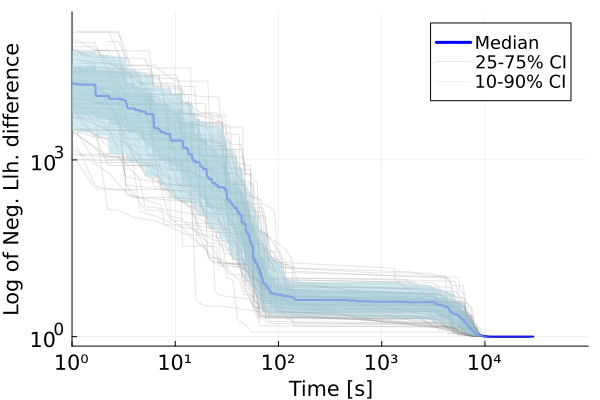

In [201]:
optimizer ="SAMIN"
nstarts = 100
Llh_type = "Numeric"

results = Numeric_results

# Because of problems with ribbon and xscale=:log10, we manually log-transform the x-values.
log_timepoints = log10.(all_timepoints)
log_t_tr =  [log10.(all_t_tr[i]) for i in 1:nstarts]

plt = plot()
plot!(plt, xlabel="Time [s]", ylabel="Log of Neg. Llh. difference")
plot!(plt, log_t_tr, all_obj_tr, label="", color=:gray, alpha=0.2)
plot!(plt, log_timepoints, [x[3] for x in percentile_values], label="Median", linewidth=2, color=:blue)
plot!(plt, log_timepoints, [x[3] for x in percentile_values], ribbon=([x[3]-x[2] for x in percentile_values], [x[4]-x[3] for x in percentile_values]),
        fillalpha=0.5, linewidth=0, color=:lightblue3, label="25-75% CI")
plot!(plt, log_timepoints, [x[3] for x in percentile_values], ribbon=([x[3]-x[1] for x in percentile_values], [x[5]-x[3] for x in percentile_values]), 
        fillalpha=0.5, linewidth=0, color=:lightblue, label="10-90% CI")
plot!(xticks=(0:4, ["10⁰", "10¹", "10²", "10³", "10⁴"]))
plot!(plt, legendfontsize=12, tickfontsize=14, guidefontsize=14, legend=true, yscale=:log10, xlimit=(0.0, 5.0))

# savefig(plt, joinpath(pwd(), "figures/ode_paper/percentile_plot_proportional_$(nstarts)_starts_$(optimizer)_$(Llh_type).pdf"))


LBFGS is 10x faster.

Waterfall Plots

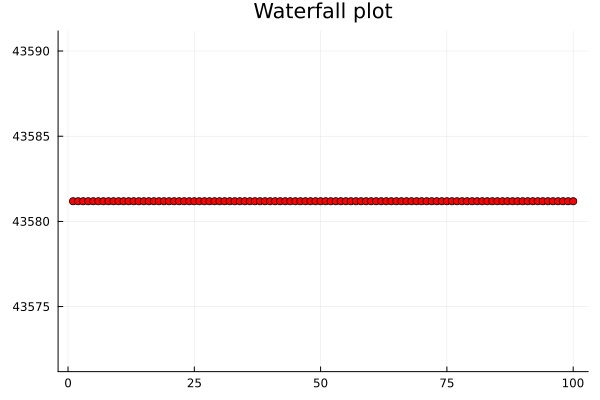

"/home/vincent/PhD/Projects/method_project/second_model/figures/ode_paper/waterfall_plot_proportional_joined_optimization_SAMIN_100_starts_Numeric.pdf"

In [31]:
# plot waterfall plot
cg = cgrad(:hsv, range(0, 1, length=nstarts))

perm = sortperm(Numeric_nllhs_list)
Numeric_nllhs_list .= Numeric_nllhs_list[perm]
Numeric_par_list .= Numeric_par_list[perm]

# set grouping by fval for color
rel_threshold = 1
k = 1
z = zeros(nstarts)
for i in 1:nstarts
    if i == 1
        z[i] = k
    else
        if Numeric_nllhs_list[i] - Numeric_nllhs_list[i-1] <= rel_threshold
            z[i] = k
        else
            k = k + 1
            z[i] = k
        end
    end
end

# cg = cgrad(:hsv, range(0, 1, length=Int(z[end])))

plt = Plots.plot(Numeric_nllhs_list, linecolor=:black, legend=false, title="Waterfall plot", ylimit=(Numeric_nllhs_list[1]-10, Numeric_nllhs_list[1]+10))
display(Plots.scatter!(plt, Numeric_nllhs_list,  color=cg[Int.(z)], legend=false, title="Waterfall plot"))

optimizer = "SAMIN"
nstarts = 100
Llh_type = "Numeric"
# savefig(joinpath(pwd(), "figures/ode_paper/waterfall_plot_proportional_joined_optimization_$(optimizer)_$(nstarts)_starts_$(Llh_type).pdf"))

They look too good, so we need to complement them with some plots.

In [89]:
using MultivariateStats

x0_Matrix = permutedims(hcat(x0_vectors...))
result_Matrix = permutedims(hcat(proportional_par_list...))

full_matrix = transpose(vcat(x0_Matrix, result_Matrix))

full_PCA = fit(PCA, full_matrix; maxoutdim = 2);

full_prediction = predict(full_PCA, full_matrix)
# projection = x0_PCA.proj

scatter(full_prediction[1,1:100], full_prediction[2,1:100], label="Startpoints", xlabel="PC1", ylabel="PC2", legend=:topright)
scatter!(full_prediction[1,101:200], full_prediction[2,101:200], label="Optimization Results", color=:red)

savefig(joinpath(pwd(), "figures/ode_paper/PCA_proportional_joined_optimization_$(optimizer)_$(nstarts)_starts.pdf"))

"/home/vincent/PhD/Projects/method_project/second_model/figures/ode_paper/PCA_proportional_joined_optimization_SAMIN_100_starts.pdf"

Alternatively, to a PCA we can also use a "double" waterfall plot. There we plot the startpoint neg. llh for eacht start and the endpoint neg. llh.

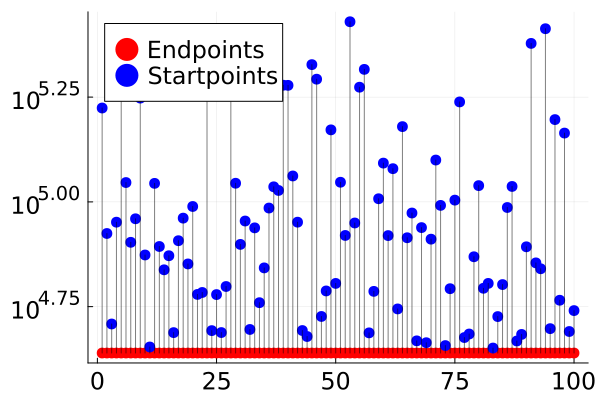

"/home/vincent/PhD/Projects/method_project/second_model/figures/ode_paper/double_waterfall_plot_proportional_joined_optimisation_LBFGS_100_starts_Analytic.pdf"

In [43]:
optimizer ="LBFGS"
n_starts = 100
Llh_type = "Analytic"

# plot waterfall plot
x0_nllhs = [PL.NegLogLikelihood(exp.(x0_vectors[i]), proportional_data, S0=0.065) for i in 1:n_starts];
cg = cgrad(:hsv, range(0, 1, length=nstarts))

perm = sortperm(proportional_nllhs_list)
proportional_nllhs_list .= proportional_nllhs_list[perm]
proportional_par_list .= proportional_par_list[perm]

# set grouping by fval for color
rel_threshold = 1
k = 1
z = zeros(nstarts)
for i in 1:nstarts
    if i == 1
        z[i] = k
    else
        if proportional_nllhs_list[i] - proportional_nllhs_list[i-1] <= rel_threshold
            z[i] = k
        else
            k = k + 1
            z[i] = k
        end
    end
end

# cg = cgrad(:hsv, range(0, 1, length=Int(z[end])))
gr(markerstrokewidth=0,markersize=6)
plt = Plots.plot(proportional_nllhs_list, linecolor=:black,label=false,  yscale=:log10, legend=:best)
Plots.scatter!(plt, 1:1:100, proportional_nllhs_list,  color=cg[Int.(z)], markershape=:circle, label="Endpoints")
scatter!(plt, 1:1:100, x0_nllhs, color=:blue, label="Startpoints")
for i in 1:n_starts
    plot!(plt, [i, i], [x0_nllhs[i], proportional_nllhs_list[i]], color=:black, label=false, alpha=0.5)
end

plot!(plt, legendfontsize=16, tickfontsize=16, guidefontsize=16)
display(plt)
optimizer = "LBFGS"
nstarts = 100
Llh_type = "Analytic"
savefig(joinpath(pwd(), "figures/ode_paper/double_waterfall_plot_proportional_joined_optimisation_$(optimizer)_$(nstarts)_starts_$(Llh_type).pdf"))

## Sparse data

In [16]:
# jointly all parameters with the sparse data

Optim(x, p) = PL.NegLogLikelihood(x, sparse_data, S0=0.065)
OptimFunc = OptimizationFunction(Optim, Optimization.AutoForwardDiff())
OptimProblem = OptimizationProblem(OptimFunc, exp.(x0), lb=zeros(5).+1e-4, ub=ones(5))
sparse_est = solve(OptimProblem, LBFGS(), maxiters=10^6, maxtime=1500.0)

retcode: Success
u: 5-element Vector{Float64}:
 0.4999947902512031
 0.012333343939102978
 0.0029957273195895914
 0.0009988734555757591
 0.0044393098019347415

In [17]:
# load optimization result
nstarts = 100
optimizer = "LBFGS"
Llh_type ="Analytic"
sparse_result_path = joinpath(pwd(),"output/results/sparse_proportional_joined_optimization_$(nstarts)_starts_$(optimizer)_distributed_$(Llh_type).jld2")
sparse_results = load(sparse_result_path)["results"]
sparse_par_names = sparse_results["par_names"]
sparse_results = sparse_results["optimization_results"]
sparse_nllhs_list = [sparse_results[i]["nllh"] for i in 1:nstarts]
sparse_par_list = [sparse_results[i]["parameter"] for i in 1:nstarts];

sparse_example = sparse_results[1]
sparse_mean_time = mean([sparse_results[i]["time_trace"][end] for i in 1:nstarts])
sparse_max_time = maximum([sparse_results[i]["time_trace"][end] for i in 1:nstarts]);

┌ Warning: some parameters could not be resolved for type OptimizationForwardDiffExt.var"#37#55"{OptimizationFunction{true, AutoForwardDiff{nothing, Nothing}, Main.ProportionalLikelihoods.var"#Optim#72"{Float64, DataFrame}, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED_NO_TIME), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing},OptimizationBase.ReInitCache{Vector{Float64},SciMLBase.NullParameters}}; reading as OptimizationForwardDiffExt.var"#37#55"{OptimizationFunction{true, AutoForwardDiff{nothing, Nothing}, Main.ProportionalLikelihoods.var"#Optim#72"{Float64, DataFrame}, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED_NO_TIME), Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing}, Any}
└ @ JLD2 /home/vincent/.julia/packages/JLD2/bfPAo/src/data/reconstructin

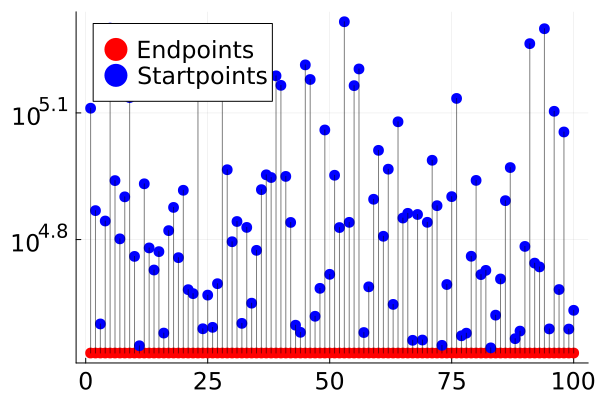

"/home/vincent/PhD/Projects/method_project/second_model/figures/ode_paper/double_waterfall_plot_sparse_proportional_joined_optimisation_LBFGS_100_starts_Analytic.pdf"

In [17]:
optimizer ="LBFGS"
n_starts = 100
Llh_type = "Analytic"

# plot waterfall plot
x0_nllhs = [PL.NegLogLikelihood(exp.(x0_vectors[i]), sparse_data, S0=0.065) for i in 1:n_starts];
cg = cgrad(:hsv, range(0, 1, length=nstarts))

perm = sortperm(sparse_nllhs_list)
sparse_nllhs_list .= sparse_nllhs_list[perm]
sparse_par_list .= sparse_par_list[perm]

# set grouping by fval for color
rel_threshold = 1
k = 1
z = zeros(nstarts)
for i in 1:nstarts
    if i == 1
        z[i] = k
    else
        if sparse_nllhs_list[i] - sparse_nllhs_list[i-1] <= rel_threshold
            z[i] = k
        else
            k = k + 1
            z[i] = k
        end
    end
end

# cg = cgrad(:hsv, range(0, 1, length=Int(z[end])))
gr(markerstrokewidth=0,markersize=6)
plt = Plots.plot(sparse_nllhs_list, linecolor=:black,label=false,  yscale=:log10, legend=:best)
Plots.scatter!(plt, 1:1:100, sparse_nllhs_list,  color=cg[Int.(z)], markershape=:circle, label="Endpoints")
scatter!(plt, 1:1:100, x0_nllhs, color=:blue, label="Startpoints")
for i in 1:n_starts
    plot!(plt, [i, i], [x0_nllhs[i], sparse_nllhs_list[i]], color=:black, label=false, alpha=0.5)
end

plot!(plt, legendfontsize=16, tickfontsize=16, guidefontsize=16)
display(plt)
optimizer = "LBFGS"
nstarts = 100
Llh_type = "Analytic"
savefig(joinpath(pwd(), "figures/ode_paper/double_waterfall_plot_sparse_proportional_joined_optimisation_$(optimizer)_$(nstarts)_starts_$(Llh_type).pdf"))

In [27]:
xlimits = (0.0, log10(max(sparse_max_time, 10.0^5)))

optimizer_trace_plots(sparse_results, xlim=xlimits)
savefig(joinpath(pwd(), "figures/ode_paper/trace_plot_sparse_proportional_$(nstarts)_starts_$(optimizer)_$(Llh_type).pdf"))

"/home/vincent/PhD/Projects/method_project/second_model/figures/ode_paper/trace_plot_sparse_proportional_100_starts_LBFGS_Analytic.pdf"

## Sampling

In [9]:
using MCMCChains
using StatsPlots
include("functionalities.jl")
using HDF5

In [30]:
# load result hdf5 file
n_iter = 1000000
n_chains = 4
result_path = joinpath(pwd(), "output/simplified_model/sampling_proportional_data_$(n_chains)chs_$(n_iter)it_$(θ).h5")
chain_dict = h5open(result_path, "r") do file
    read(file,)
end
chain = dict_to_chain(chain_dict, ["beta", "m_basal", "m_size", "d_size", "d_metastasis"], n_chains, n_iter)

Chains MCMC chain (1000001×5×4 Array{Float64, 3}):

Iterations        = 1:1:1000001
Number of chains  = 4
Samples per chain = 1000001
parameters        = beta, m_basal, m_size, d_size, d_metastasis

Summary Statistics
    parameters      mean       std      mcse      ess_bulk      ess_tail       ⋯
        Symbol   Float64   Float64   Float64       Float64       Float64   Flo ⋯

          beta    0.5000    0.0001    0.0000   242212.2549   370281.8410    1. ⋯
       m_basal    0.0125    0.0016    0.0000   189094.1962   214415.2756    1. ⋯
        m_size    0.0030    0.0001    0.0000   241182.2185   360736.6529    1. ⋯
        d_size    0.0010    0.0001    0.0000   240810.9306   357894.0817    1. ⋯
  d_metastasis    0.0051    0.0024    0.0000   230035.0464   323611.7396    1. ⋯
                                                               2 columns omitted

Quantiles
    parameters      2.5%     25.0%     50.0%     75.0%     97.5% 
        Symbol   Float64   Float64   Float64   Float64  

In [32]:
burn_in = burn_in_from_geweke(chain)
if burn_in >= length(chain)
    burn_in = Int(floor(length(chain)/2))
    
end

In [33]:
par_quantiles = quantile(chain[burn_in:end]; q=[0.01, 0.025, 0.05, 0.1, 0.5, 0.9, 0.95, 0.975, 0.99])

Quantiles
    parameters      1.0%      2.5%      5.0%     10.0%     50.0%     90.0%     ⋯
        Symbol   Float64   Float64   Float64   Float64   Float64   Float64   F ⋯

          beta    0.4998    0.4999    0.4999    0.4999    0.5000    0.5000     ⋯
       m_basal    0.0090    0.0095    0.0100    0.0105    0.0124    0.0144     ⋯
        m_size    0.0028    0.0028    0.0029    0.0029    0.0030    0.0031     ⋯
        d_size    0.0008    0.0009    0.0009    0.0009    0.0010    0.0011     ⋯
  d_metastasis    0.0004    0.0009    0.0014    0.0020    0.0049    0.0084     ⋯
                                                               3 columns omitted


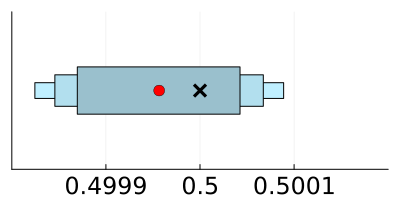

In [36]:
par_id = 1
example_par = exp.(LBFGS_example["parameter"])
true_par = [0.5, 0.01, 0.003, 0.001, 0.002]

plt = bar([0.5],
    [par_quantiles.nt[9][par_id]], 
    fillto=[par_quantiles.nt[3][par_id]], 
    xlimits=(par_quantiles.nt[2][par_id], par_quantiles.nt[10][par_id]),
    orientation=:h, 
    bar_width=0.1,
    color=:lightblue1,
    alpha=1.0, 
    label="95%CI")
bar!(plt, [0.5],
    [par_quantiles.nt[8][par_id]], 
    fillto=[par_quantiles.nt[4][par_id]], 
    xlimits=(par_quantiles.nt[2][par_id], par_quantiles.nt[10][par_id]),
    orientation=:h, 
    bar_width=0.2,
    color=:lightblue2,
    alpha=1.0, 
    label="90%CI")
bar!(plt, [0.5],
    [par_quantiles.nt[7][par_id]], 
    fillto=[par_quantiles.nt[5][par_id]], 
    xlimits=(par_quantiles.nt[2][par_id], par_quantiles.nt[10][par_id]),
    ylimits=(0.0, 1.0),
    orientation=:h, 
    bar_width=0.3,
    alpha=1.0, 
    color=:lightblue3,
    yticks=false,
    label="80%CI")
plot!([example_par[par_id]],[0.5], seriestype=:scatter, label="MLE", color=:red, markersize=6)
plot!([true_par[par_id]],[0.5], seriestype=:scatter, marker=:xcross, markerstrokewidth=8, label="True", color=:black, markersize=6)
x = true_par[par_id]
x_lower_limit = max(0, x-max(x-par_quantiles.nt[2][par_id], par_quantiles.nt[10][par_id]-x))
x_upper_limit = x+max(x-par_quantiles.nt[2][par_id], par_quantiles.nt[10][par_id]-x)
plot!(xlimits=(x_lower_limit, x_upper_limit))
x_ticks = LinRange(x_lower_limit, x_upper_limit, 5)[2:end-1]
plot!(xticks = (x_ticks, round.(x_ticks, digits=4)))
plot!(size=(400, 200), formatter=:plain, legend=false, tickfontsize=16, legendfontsize=16, guidefontsize=16)
display(plt)
# savefig("figures/ode_paper/proportional_$(sparse_par_names[par_id])_estimate_cis.pdf")


In [37]:
# load result hdf5 file
n_iter = 100000
n_chains = 4
sparse_result_path = joinpath(pwd(), "output/simplified_model/sampling_sparse_proportional_data_$(n_chains)chs_$(n_iter)it_$(θ).h5")
sparse_chain_dict = h5open(sparse_result_path, "r") do file
    read(file,)
end
sparse_chain = dict_to_chain(sparse_chain_dict, ["beta", "m_basal", "m_size", "d_size", "d_metastasis"], n_chains, n_iter)

Chains MCMC chain (100001×5×4 Array{Float64, 3}):

Iterations        = 1:1:100001
Number of chains  = 4
Samples per chain = 100001
parameters        = beta, m_basal, m_size, d_size, d_metastasis

Summary Statistics
    parameters      mean       std      mcse     ess_bulk     ess_tail      rh ⋯
        Symbol   Float64   Float64   Float64      Float64      Float64   Float ⋯

          beta    0.5000    0.0001    0.0000   17706.8999   16433.9674    1.00 ⋯
       m_basal    0.0125    0.0017    0.0000    8317.7306    4186.8186    1.00 ⋯
        m_size    0.0030    0.0004    0.0000   16201.5239   20068.3503    1.00 ⋯
        d_size    0.0010    0.0001    0.0000   18457.6832   25443.1906    1.00 ⋯
  d_metastasis    0.0050    0.0024    0.0000   12742.5166   14444.9190    1.00 ⋯
                                                               2 columns omitted

Quantiles
    parameters      2.5%     25.0%     50.0%     75.0%     97.5% 
        Symbol   Float64   Float64   Float64   Float64   Fl

In [38]:
sparse_burn_in = burn_in_from_geweke(sparse_chain)
if sparse_burn_in >= length(sparse_chain)
    sparse_burn_in = Int(floor(length(sparse_chain)/2))
end

50000

In [39]:
sparse_par_quantiles = quantile(sparse_chain[sparse_burn_in:end]; q=[0.01, 0.025, 0.05, 0.1, 0.5, 0.9, 0.95, 0.975, 0.99])

Quantiles
    parameters      1.0%      2.5%      5.0%     10.0%     50.0%     90.0%     ⋯
        Symbol   Float64   Float64   Float64   Float64   Float64   Float64   F ⋯

          beta    0.4998    0.4999    0.4999    0.4999    0.5000    0.5001     ⋯
       m_basal    0.0091    0.0096    0.0100    0.0105    0.0124    0.0145     ⋯
        m_size    0.0028    0.0028    0.0028    0.0029    0.0030    0.0031     ⋯
        d_size    0.0009    0.0009    0.0009    0.0009    0.0010    0.0011     ⋯
  d_metastasis    0.0004    0.0009    0.0014    0.0020    0.0048    0.0083     ⋯
                                                               3 columns omitted


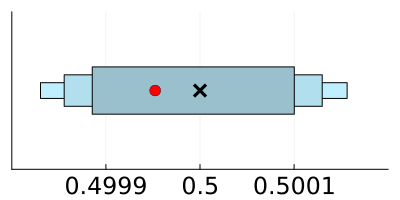

"/home/vincent/PhD/Projects/method_project/second_model/figures/ode_paper/sparse_proportional_beta_estimate_cis.pdf"

In [50]:
sparse_par_id = 1
sparse_example_par = exp.(sparse_example["parameter"])
true_par = [0.5, 0.01, 0.003, 0.001, 0.002]

plt = bar([0.5],
    [sparse_par_quantiles.nt[9][sparse_par_id]], 
    fillto=[sparse_par_quantiles.nt[3][sparse_par_id]], 
    xlimits=(sparse_par_quantiles.nt[2][sparse_par_id], sparse_par_quantiles.nt[10][sparse_par_id]),
    orientation=:h, 
    bar_width=0.1,
    color=:lightblue1,
    alpha=1.0, 
    label="95%CI")
bar!(plt, [0.5],
    [sparse_par_quantiles.nt[8][sparse_par_id]], 
    fillto=[sparse_par_quantiles.nt[4][sparse_par_id]], 
    xlimits=(sparse_par_quantiles.nt[2][sparse_par_id], sparse_par_quantiles.nt[10][sparse_par_id]),
    orientation=:h, 
    bar_width=0.2,
    color=:lightblue2,
    alpha=1.0, 
    label="90%CI")
bar!(plt, [0.5],
    [sparse_par_quantiles.nt[7][sparse_par_id]], 
    fillto=[sparse_par_quantiles.nt[5][sparse_par_id]], 
    xlimits=(sparse_par_quantiles.nt[2][sparse_par_id], sparse_par_quantiles.nt[10][sparse_par_id]),
    ylimits=(0.0, 1.0),
    orientation=:h, 
    bar_width=0.3,
    alpha=1.0, 
    color=:lightblue3,
    yticks=false,
    label="80%CI")
plot!([example_par[sparse_par_id]],[0.5], seriestype=:scatter, label="MLE", color=:red, markersize=6)
plot!([true_par[sparse_par_id]],[0.5], seriestype=:scatter, marker=:xcross, markerstrokewidth=8, label="True", color=:black, markersize=6)
x = true_par[sparse_par_id]
x_lower_limit = max(0, x-max(x-sparse_par_quantiles.nt[2][sparse_par_id], sparse_par_quantiles.nt[10][sparse_par_id]-x))
x_upper_limit = x+max(x-sparse_par_quantiles.nt[2][sparse_par_id], sparse_par_quantiles.nt[10][sparse_par_id]-x)
plot!(xlimits=(x_lower_limit, x_upper_limit))
x_ticks = LinRange(x_lower_limit, x_upper_limit, 5)[2:end-1]
plot!(xticks = (x_ticks, round.(x_ticks, digits=4)))
plot!(size=(400, 200), formatter=:plain, legend=false, tickfontsize=16, legendfontsize=16, guidefontsize=16)
display(plt)
savefig("figures/ode_paper/sparse_proportional_$(sparse_par_names[sparse_par_id])_estimate_cis.pdf")


Next, compare both in one plot.

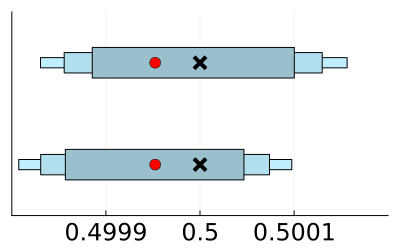

"/home/vincent/PhD/Projects/method_project/second_model/figures/ode_paper/compare_sparse_proportional_beta_estimate_cis.pdf"

In [64]:
sparse_par_id = 1
par_id = sparse_par_id
example_par = exp.(LBFGS_example["parameter"])
sparse_example_par = exp.(sparse_example["parameter"])
true_par = [0.5, 0.01, 0.003, 0.001, 0.002]

plt = bar([0.5],
    [par_quantiles.nt[9][par_id]], 
    fillto=[par_quantiles.nt[3][par_id]], 
    xlimits=(par_quantiles.nt[2][par_id], par_quantiles.nt[10][par_id]),
    orientation=:h, 
    bar_width=0.1,
    color=:lightblue1,
    alpha=1.0, 
    label="95%CI")
bar!(plt, [0.5],
    [par_quantiles.nt[8][par_id]], 
    fillto=[par_quantiles.nt[4][par_id]], 
    xlimits=(par_quantiles.nt[2][par_id], par_quantiles.nt[10][par_id]),
    orientation=:h, 
    bar_width=0.2,
    color=:lightblue2,
    alpha=1.0, 
    label="90%CI")
bar!(plt, [0.5],
    [par_quantiles.nt[7][par_id]], 
    fillto=[par_quantiles.nt[5][par_id]], 
    xlimits=(par_quantiles.nt[2][par_id], par_quantiles.nt[10][par_id]),
    ylimits=(0.0, 2.0),
    orientation=:h, 
    bar_width=0.3,
    alpha=1.0, 
    color=:lightblue3,
    label="80%CI")
plot!([example_par[par_id]],[0.5], seriestype=:scatter, label="MLE full data", color=:red, markersize=6)
plot!([true_par[par_id]],[0.5], seriestype=:scatter, marker=:xcross, markerstrokewidth=8, color=:black, markersize=6)

bar!([1.5],
    [sparse_par_quantiles.nt[9][sparse_par_id]], 
    fillto=[sparse_par_quantiles.nt[3][sparse_par_id]], 
    xlimits=(sparse_par_quantiles.nt[2][sparse_par_id], sparse_par_quantiles.nt[10][sparse_par_id]),
    orientation=:h, 
    bar_width=0.1,
    color=:lightblue1,
    alpha=1.0, 
    label="95%CI")
bar!(plt, [1.5],
    [sparse_par_quantiles.nt[8][sparse_par_id]], 
    fillto=[sparse_par_quantiles.nt[4][sparse_par_id]], 
    xlimits=(sparse_par_quantiles.nt[2][sparse_par_id], sparse_par_quantiles.nt[10][sparse_par_id]),
    orientation=:h, 
    bar_width=0.2,
    color=:lightblue2,
    alpha=1.0, 
    label="90%CI")
bar!(plt, [1.5],
    [sparse_par_quantiles.nt[7][sparse_par_id]], 
    fillto=[sparse_par_quantiles.nt[5][sparse_par_id]], 
    xlimits=(sparse_par_quantiles.nt[2][sparse_par_id], sparse_par_quantiles.nt[10][sparse_par_id]),
    ylimits=(0.0, 2.0),
    orientation=:h, 
    bar_width=0.3,
    alpha=1.0, 
    color=:lightblue3,
    yticks=false,
    label="80%CI")
plot!([example_par[sparse_par_id]],[1.5], seriestype=:scatter, label="MLE", color=:red, markersize=6)
plot!([true_par[sparse_par_id]],[1.5], seriestype=:scatter, marker=:xcross, markerstrokewidth=8, label="True", color=:black, markersize=6)
x = true_par[sparse_par_id]
x_lower_limit = max(0, x-max(x-sparse_par_quantiles.nt[2][sparse_par_id], sparse_par_quantiles.nt[10][sparse_par_id]-x))
x_upper_limit = x+max(x-sparse_par_quantiles.nt[2][sparse_par_id], sparse_par_quantiles.nt[10][sparse_par_id]-x)
plot!(xlimits=(x_lower_limit, x_upper_limit))
x_ticks = LinRange(x_lower_limit, x_upper_limit, 5)[2:end-1]
plot!(xticks = (x_ticks, round.(x_ticks, digits=4)))
# y_ticks = ["sparse data", "full data"]
# plot!(yticks = ([0.5, 1.5], y_ticks))
plot!(size=(400, 200), formatter=:plain, legend=false, tickfontsize=16, legendfontsize=16, guidefontsize=16)
display(plt)
savefig("figures/ode_paper/compare_sparse_proportional_$(sparse_par_names[sparse_par_id])_estimate_cis.pdf")


In [ ]:
StatsPlots.plot(chain[burn_in:end])

In [13]:
proportional_par_names
example_par = exp.(LBFGS_example["parameter"])

5-element Vector{Float64}:
 0.49996390051157347
 0.012329015273511615
 0.003015392398291145
 0.0009827242541910748
 0.004551225053195942

In [33]:
minimum(chain[burn_in:end, "beta", :])

0.4997107970067834

In [35]:
true_par = [beta, m_basal, m_size, d_size, d_metastasis]
example_res_df = DataFrame(parameter=proportional_par_names, value=example_par, true_value=true_par)

for id in eachindex(proportional_par_names)
    par = proportional_par_names[id]
    plt = StatsPlots.plot(chain[burn_in:end, par,:], seriestype=:density, label=false)
    vline!(plt, [example_res_df[example_res_df.parameter .== par, :true_value]], color="black", label="true value", linewidth=2)
    vline!(plt, [example_res_df[example_res_df.parameter .== par, :value]], color="red", label="MLE", linewidth=2)
    x_ticks = LinRange(minimum(chain[burn_in:end, par,:]), maximum(chain[burn_in:end, par,:]), 5)
    plot!(legendfontsize=16, tickfontsize=16, guidefontsize=16, title="", xticks = (x_ticks, round.(x_ticks, digits=5)))
    save_path = joinpath(pwd(), "figures/ode_paper/density_$(par)_proportional_model.pdf")
    println(id, par)
    Plots.savefig(plt, save_path)
end

1beta
2m_basal
3m_size
4d_size
5d_metastasis
